In [1]:
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scanpy as sc

import sys
sys.path.append('../src')
from utils import *

## All relevent materials involved in the following example are availabel from [here](https://drive.google.com/drive/folders/1PXv_brtr-tXshBVEd_HSPIagjX9oF7Kg?usp=sharing)

## 3D alignment using PASTE

In [16]:
import paste as pst
from scipy.spatial.distance import pdist
import matplotlib.patches as mpatches

#### Load data

In [351]:
slice1_file = '../demo_data/Visium_MouseBrain_Cortex_section1.h5ad'
slice2_file = '../demo_data/Visium_MouseBrain_Cortex_section2.h5ad'
# These two .h5ad file had been performed Step 1 (Nuclei segmentation), see more detial in Human-Heart.ipynb

slice1 = sc.read(slice1_file)
slice2 = sc.read(slice2_file)

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [263]:
slice1.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums
0,7910.500000,3181.500000,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_0,8
1,7915.866197,3149.855634,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_1,8
2,7942.919540,3123.827586,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_2,8
3,7948.000000,3205.769231,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_3,8
4,7939.994505,3180.730769,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_4,8


/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


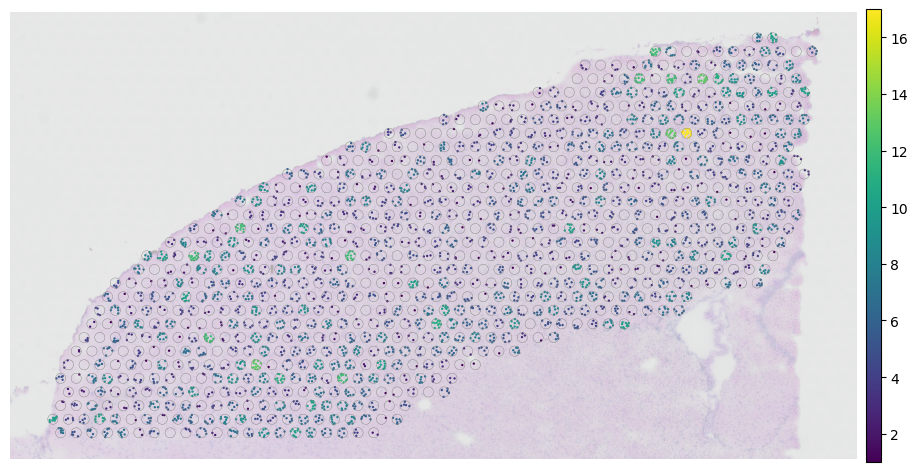

In [264]:
fig, ax = plt.subplots(1,1,figsize=(12, 6),dpi=100)
PlotVisiumCells(slice1,"cell_nums",0.23,0.35,0.3,ax=ax)

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


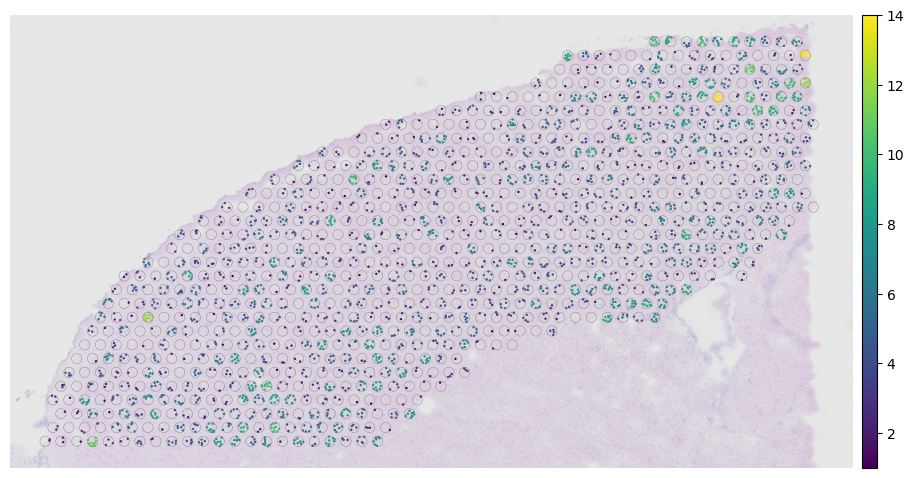

In [265]:
fig, ax = plt.subplots(1,1,figsize=(12, 6),dpi=100)
PlotVisiumCells(slice2,"cell_nums",0.23,0.35,0.3,ax=ax)

#### Align two slices with PASTE

In [266]:
slice1.obs.index = ['slice1-'+_ for _ in slice1.obs.index]
slice2.obs.index = ['slice2-'+_ for _ in slice2.obs.index]
slice1.uns['cell_locations']['slice_index'] = 'slice1'
slice2.uns['cell_locations']['slice_index'] = 'slice2'
slice1.uns['cell_locations']['spot_index'] = slice1.uns['cell_locations']['spot_index'].map(lambda x:'slice1-'+x)
slice2.uns['cell_locations']['spot_index'] = slice2.uns['cell_locations']['spot_index'].map(lambda x:'slice2-'+x)
slice1.uns['cell_locations']['cell_index'] = slice1.uns['cell_locations']['cell_index'].map(lambda x:'slice1-'+x)
slice2.uns['cell_locations']['cell_index'] = slice2.uns['cell_locations']['cell_index'].map(lambda x:'slice2-'+x)

slice1.obs_names_make_unique()
slice2.obs_names_make_unique()
slice1.var_names_make_unique()
slice2.var_names_make_unique()

In [267]:
slice1.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,slice_index
0,7910.500000,3181.500000,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_0,8,slice1
1,7915.866197,3149.855634,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_1,8,slice1
2,7942.919540,3123.827586,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_2,8,slice1
3,7948.000000,3205.769231,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_3,8,slice1
4,7939.994505,3180.730769,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_4,8,slice1


In [268]:
slice2.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,slice_index
0,8007.241667,3293.700000,slice2-AAACAGAGCGACTCCT-1,slice2-AAACAGAGCGACTCCT-1_0,9,slice2
1,8023.668033,3280.393443,slice2-AAACAGAGCGACTCCT-1,slice2-AAACAGAGCGACTCCT-1_1,9,slice2
2,8070.021978,3271.000000,slice2-AAACAGAGCGACTCCT-1,slice2-AAACAGAGCGACTCCT-1_2,9,slice2
3,8051.697674,3271.736434,slice2-AAACAGAGCGACTCCT-1,slice2-AAACAGAGCGACTCCT-1_3,9,slice2
4,8058.884444,3330.088889,slice2-AAACAGAGCGACTCCT-1,slice2-AAACAGAGCGACTCCT-1_4,9,slice2


In [269]:
# Pairwise align the slices
pi12 = pst.pairwise_align(slice1, slice2)

Using selected backend cpu. If you want to use gpu, set use_gpu = True.


In [270]:
slices, pis = [slice1, slice2], [pi12]
new_slices = pst.stack_slices_pairwise(slices, pis)

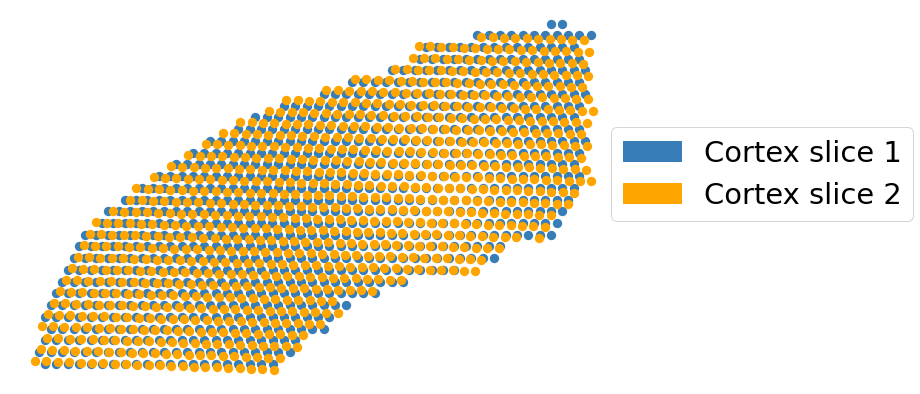

In [271]:
slice_colors = ['#e41a1c','#377eb8']
slice_colors = ['teal', 'orange']
slice_colors = ['#377eb8', 'orange']
plt.figure(figsize=(11,7))
for i in range(len(new_slices)):
    pst.plot_slice(new_slices[i],slice_colors[i],s=350)
plt.legend(handles=[mpatches.Patch(color=slice_colors[0], label='Cortex slice 1'),mpatches.Patch(color=slice_colors[1], label='Cortex slice 2')],
           fontsize=29,bbox_to_anchor=(.96,.72))
plt.gca().invert_yaxis()
plt.axis('off')
plt.show()

In [272]:
new_slices[0].obsm['spatial'] = np.hstack((new_slices[0].obsm['spatial'],
                                          np.zeros((new_slices[0].obsm['spatial'].shape[0],1))))
new_slices[1].obsm['spatial'] = np.hstack((new_slices[1].obsm['spatial'],
                                          (pdist(new_slices[0].obsm['spatial']).min()**2/2)**.5/2 * np.ones((new_slices[1].obsm['spatial'].shape[0],1))))

In [273]:
slice1.obsm['spatial_align'] = new_slices[0].obsm['spatial']
slice2.obsm['spatial_align'] = new_slices[1].obsm['spatial']

In [274]:
slice1.obsm['spatial']

array([[7950, 3163],
       [9257, 4241],
       [5747, 4361],
       ...,
       [5610, 3642],
       [5885, 4361],
       [6780, 5199]])

In [275]:
slice1.obsm['spatial_align']

array([[ 1592.37822014, -1400.27868852,     0.        ],
       [ 2899.37822014,  -322.27868852,     0.        ],
       [ -610.62177986,  -202.27868852,     0.        ],
       ...,
       [ -747.62177986,  -921.27868852,     0.        ],
       [ -472.62177986,  -202.27868852,     0.        ],
       [  422.37822014,   635.72131148,     0.        ]])

In [276]:
def align_cell_locations(slice1):
    spot_indexs = slice1.obs.index.values
    cell_locations_align = slice1.uns['cell_locations'].copy()
    for row in cell_locations_align.iterrows():
        spot_id = np.where(spot_indexs==row[1]['spot_index'])[0][0]
        cell_locations_align.loc[row[0],'x'] = row[1]['x'] - slice1.obsm['spatial'][spot_id,0] + slice1.obsm['spatial_align'][spot_id,0]
        cell_locations_align.loc[row[0],'y']  = row[1]['y'] - slice1.obsm['spatial'][spot_id,1] + slice1.obsm['spatial_align'][spot_id,1]    
    cell_locations_align['z'] = slice1.obsm['spatial_align'][spot_id,2]
    slice1.uns['cell_locations'] = cell_locations_align
    
align_cell_locations(slice1)
align_cell_locations(slice2)

In [277]:
slice1.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,slice_index,z
0,1552.878220,-1381.778689,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_0,8,slice1,0.0
1,1558.244417,-1413.423055,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_1,8,slice1,0.0
2,1585.297760,-1439.451102,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_2,8,slice1,0.0
3,1590.378220,-1357.509458,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_3,8,slice1,0.0
4,1582.372726,-1382.547919,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_4,8,slice1,0.0


In [278]:
spatial_align = np.vstack((slice1.obsm['spatial_align'],slice2.obsm['spatial_align']))
cell_locations_align = slice1.uns['cell_locations'].append(slice2.uns['cell_locations']).reset_index(drop=True)

/home/share/xiaojs/software/netMHCpan-4.1/Linux_x86_64/tmp/ipykernel_4891/1740432794.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cell_locations_align = slice1.uns['cell_locations'].append(slice2.uns['cell_locations']).reset_index(drop=True)


#### Combine two slices into a unified 3D ST data with aligned spatial locations

In [279]:
del slice1.raw
del slice2.raw
slice_3D = slice1.concatenate(
        slice2,
        batch_key=None,
        uns_merge="unique",
        index_unique=None
        )

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


#### .obsm['spatial'] and .uns['cell_locations'] are most important

In [280]:
slice_3D.obsm['spatial'] = spatial_align
slice_3D.uns['cell_locations'] = cell_locations_align

In [281]:
slice_3D.obsm['spatial']

array([[ 1592.37822014, -1400.27868852,     0.        ],
       [ 2899.37822014,  -322.27868852,     0.        ],
       [ -610.62177986,  -202.27868852,     0.        ],
       ...,
       [-1084.26238373,  -397.01811884,    48.43681451],
       [-2336.26848367,    44.07793161,    48.43681451],
       [ -830.24461369,   329.05004085,    48.43681451]])

In [282]:
slice_3D.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,slice_index,z
0,1552.878220,-1381.778689,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_0,8,slice1,0.0
1,1558.244417,-1413.423055,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_1,8,slice1,0.0
2,1585.297760,-1439.451102,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_2,8,slice1,0.0
3,1590.378220,-1357.509458,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_3,8,slice1,0.0
4,1582.372726,-1382.547919,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_4,8,slice1,0.0


In [294]:
slice_3D.write('../output/cortex/sp_adata_ns.h5ad')

In [353]:
slice_3D.X.max()

7.3130717

## Run SpatialScope (Cell type identification)

```
python ./src/Cell_Type_Identification.py --tissue cortex --out_dir  ./output  --ST_Data ./output/cortex/sp_adata_ns.h5ad --SC_Data ./Ckpts_scRefs/VISp/Ref_scRNA_VISp_qc2_2Kgenes.h5ad --cell_class_column cell_subclass --nu 15
```

In [354]:
celltype_res = pd.read_csv('../output/cortex/CellTypeLabel_nu15.csv',index_col=0)

In [355]:
celltype_res.head()

,x,y,spot_index,cell_index,cell_nums,slice_index,z,discrete_label,discrete_label_ct
0,1552.878220,-1381.778689,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_0,8,slice1,0.0,3,L2/3 IT
1,1558.244417,-1413.423055,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_1,8,slice1,0.0,3,L2/3 IT
2,1585.297760,-1439.451102,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_2,8,slice1,0.0,3,L2/3 IT
3,1590.378220,-1357.509458,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_3,8,slice1,0.0,0,Astro
4,1582.372726,-1382.547919,slice1-AAACAGAGCGACTCCT-1,slice1-AAACAGAGCGACTCCT-1_4,8,slice1,0.0,3,L2/3 IT


In [356]:
slice1_file = '../demo_data/Visium_MouseBrain_Cortex_section1.h5ad'
slice2_file = '../demo_data/Visium_MouseBrain_Cortex_section2.h5ad'
slice1 = sc.read(slice1_file)
slice2 = sc.read(slice2_file)

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [357]:
slice1.uns['cell_locations']['discrete_label_ct'] = celltype_res.loc[celltype_res['slice_index']=='slice1','discrete_label_ct'].values
slice2.uns['cell_locations']['discrete_label_ct'] = celltype_res.loc[celltype_res['slice_index']=='slice2','discrete_label_ct'].values

In [358]:
slice1.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,discrete_label_ct
0,7910.500000,3181.500000,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_0,8,L2/3 IT
1,7915.866197,3149.855634,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_1,8,L2/3 IT
2,7942.919540,3123.827586,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_2,8,L2/3 IT
3,7948.000000,3205.769231,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_3,8,Astro
4,7939.994505,3180.730769,AAACAGAGCGACTCCT-1,AAACAGAGCGACTCCT-1_4,8,L2/3 IT


In [359]:
color_dict = {'Astro': '#1f77b4',
 'CR': '#aec7e8',
 'Endo': '#ffbb78',
 'L2/3 IT': '#ff7f0e',
 'L4': '#2ca02c',
 'L5 IT': '#bcbd22',
 'L5 NP': '#d62728',
 'L5 PT': '#ff9896',
 'L6 CT': '#17becf',
 'L6 IT': '#c5b0d5',
 'L6b': '#8c564b',
 'Lamp5': '#c49c94',
 'Macrophage': '#e377c2',
 'Meis2': '#f7b6d2',
 'Oligo': '#7f7f7f',
 'Peri': '#c7c7c7',
 'Pvalb': '#98df8a',
 'SMC': '#dbdb8d',
 'Serpinf1': '#9467bd',
 'Sncg': '#9edae5',
 'Sst': '#82A8CE',
 'VLMC': '#B87BCE',
 'Vip': '#3FC241'}

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


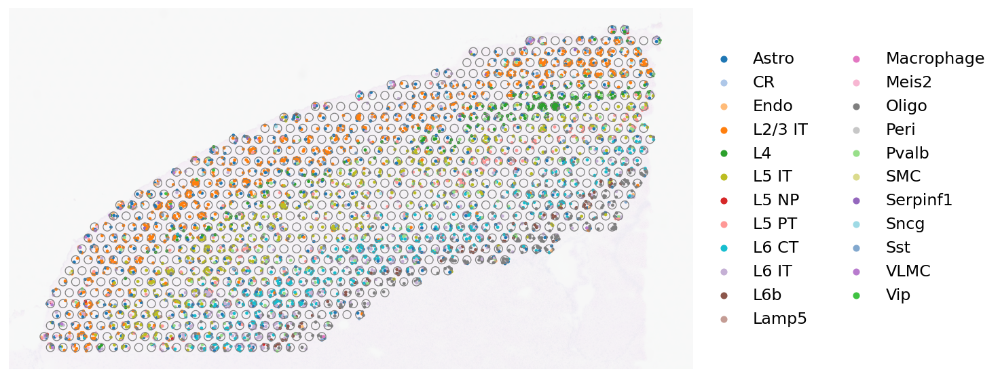

In [360]:
fig, ax = plt.subplots(1,1,figsize=(10, 8),dpi=130)
PlotVisiumCells(slice1,"discrete_label_ct",size=0.4,alpha_img=0.1,lw=0.7,palette=color_dict,ax=ax)

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


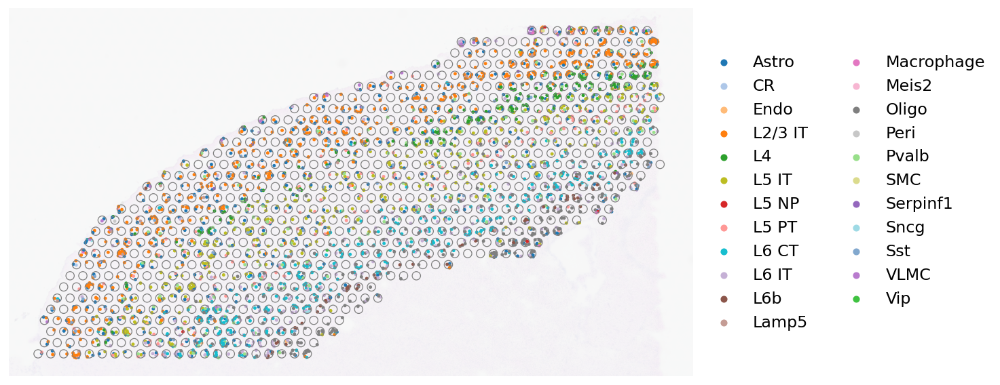

In [361]:
fig, ax = plt.subplots(1,1,figsize=(10, 8),dpi=130)
PlotVisiumCells(slice2,"discrete_label_ct",size=0.4,alpha_img=0.1,lw=0.7,palette=color_dict,ax=ax)

In [362]:
xyz1 = celltype_res.loc[celltype_res['slice_index']=='slice1',['x','y','z']].values
xyz2 = celltype_res.loc[celltype_res['slice_index']=='slice2',['x','y','z']].values

x1,y1,z1 = xyz1[:,0],xyz1[:,1],xyz1[:,2]
x2,y2,z2 = xyz2[:,0],xyz2[:,1],xyz2[:,2]

/home/share/xiaojs/software/netMHCpan-4.1/Linux_x86_64/tmp/ipykernel_4891/1359269678.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')# fig.add_subplot(projection='3d')


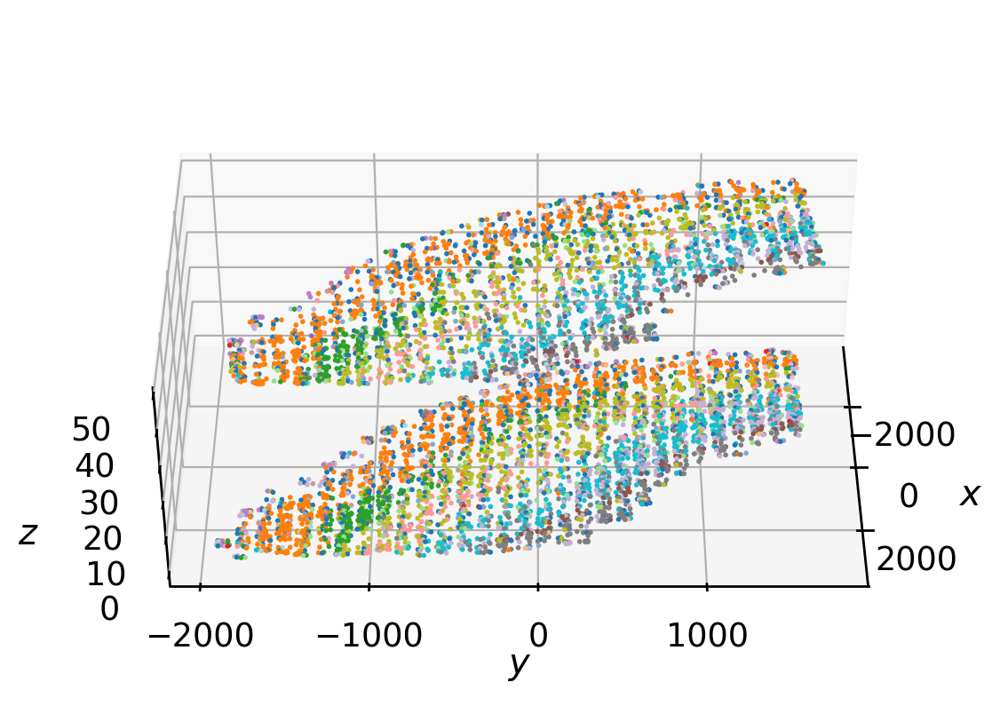

In [363]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(10,5),dpi=200)
ax = fig.gca(projection='3d')# fig.add_subplot(projection='3d')


ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([0.85, 1.6, 0.8, 1]))

ax.scatter(x1, y1, z1, c=slice1.uns['cell_locations']['discrete_label_ct'].map(color_dict), s=1.5, alpha=1)
ax.scatter(x2, y2, z2, c=slice2.uns['cell_locations']['discrete_label_ct'].map(color_dict), s=1.5, alpha=1)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')

#ax.set_box_aspect([np.ptp(i) for i in data])  # equal aspect ratio
# add a legend
#handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in color_dict.items()]
#ax.legend(title='color', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')

ax.view_init(40,0)
#fig.colorbar(p, ax=ax)
plt.show()

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


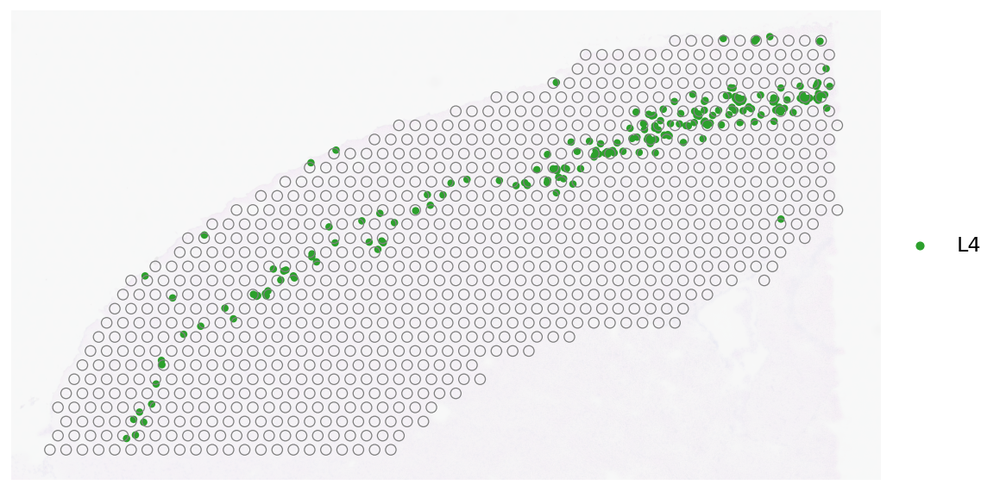

In [364]:
fig, ax = plt.subplots(1,1,figsize=(10, 8),dpi=130)
l_class = ['L4']#, 'L6 CT', 'L6b'] 
PlotVisiumCells(slice2,"discrete_label_ct",size=0.7,alpha_img=0.1,lw=0.7,subset=l_class,palette=color_dict,ax=ax)

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


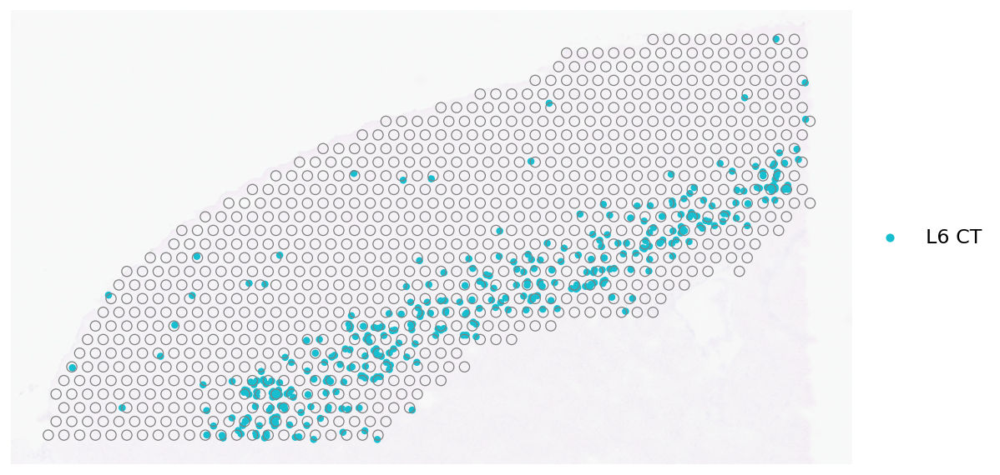

In [365]:
fig, ax = plt.subplots(1,1,figsize=(10, 8),dpi=130)
l_class = ['L6 CT']#, 'L6 CT', 'L6b'] 
PlotVisiumCells(slice2,"discrete_label_ct",size=0.7,alpha_img=0.1,lw=0.7,subset=l_class,palette=color_dict,ax=ax)

## Step3: Gene expression decomposition

```
python ./src/Decomposition.py --tissue cortex --out_dir  ./output --SC_Data ./Ckpts_scRefs/VISp/Ref_scRNA_VISp_qc2_2Kgenes.h5ad --cell_class_column cell_subclass  --ckpt_path ./Ckpts_scRefs/VISp/model_500001.pt --spot_range 0,500 --gpu 2,3,4,8

python ./src/Decomposition.py --tissue cortex --out_dir  ./output --SC_Data ./Ckpts_scRefs/VISp/Ref_scRNA_VISp_qc2_2Kgenes.h5ad --cell_class_column cell_subclass  --ckpt_path ./Ckpts_scRefs/VISp/model_500001.pt --spot_range 500,1000 --gpu 2,3,4,8

python ./src/Decomposition.py --tissue cortex --out_dir  ./output --SC_Data ./Ckpts_scRefs/VISp/Ref_scRNA_VISp_qc2_2Kgenes.h5ad --cell_class_column cell_subclass  --ckpt_path ./Ckpts_scRefs/VISp/model_500001.pt --spot_range 1000,1715 --gpu 1,2,4,8
```

#### scRef and sampled pseudo-cells

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


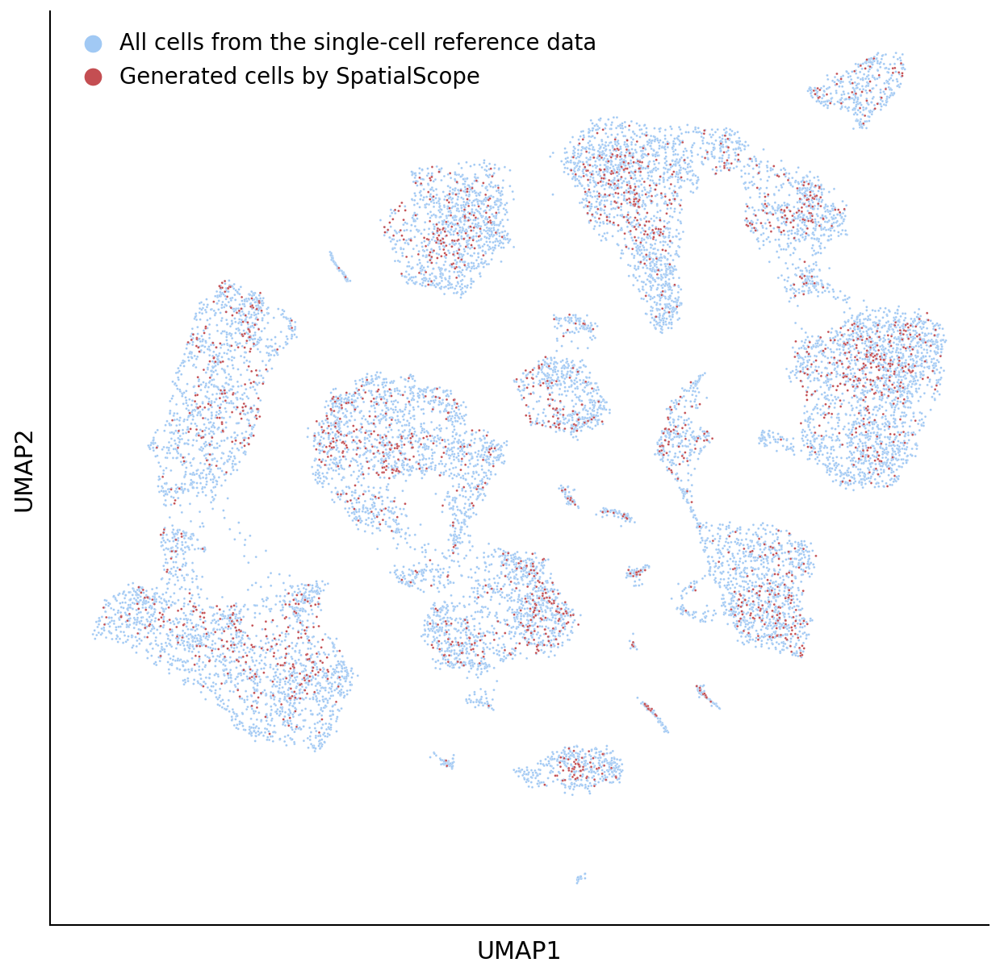

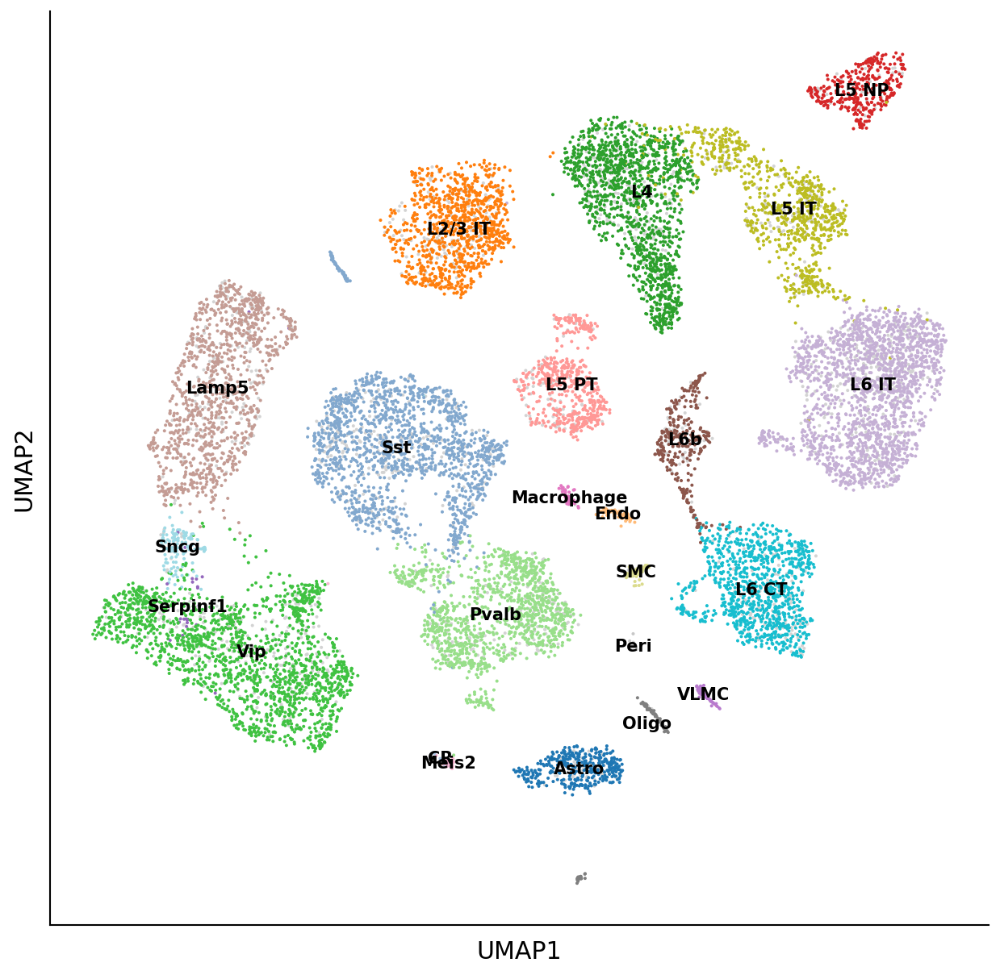

In [345]:
ad_sc = sc.read('../Ckpts_scRefs/VISp/Ref_scRNA_VISp_qc2_2Kgenes.h5ad')
sampled_cells = sc.read('../Ckpts_scRefs/VISp/model_500001.h5ad') # 2K cells sampled from the learned gene expression distribution of scRef
cell_type_key='cell_subclass'
sns.set_context('paper',font_scale=1.5)
adata_all = PlotSampledData(sampled_cells,ad_sc,cell_type_key,palette=color_dict)

#### decomposed single-cell resolution ST data

In [383]:
ad_scsts_list = []
ad_scsts_list.append(sc.read('../output/cortex/generated_cells_spot0_500.h5ad'))
ad_scsts_list.append(sc.read('../output/cortex/generated_cells_spot500_1000.h5ad'))
ad_scsts_list.append(sc.read('../output/cortex/generated_cells_spot1000_1715.h5ad'))

ad_scsts = ad_scsts_list[0].concatenate(
        ad_scsts_list[1:],
        batch_key="_",
        uns_merge="unique",
        index_unique=None
        )

ad_scst_slice2 = ad_scsts[ad_scsts.obs.slice_index=='slice2']

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [401]:
slice2_file = '../demo_data/Visium_MouceBrain_Cortex_section2.h5ad'
slice2 = sc.read(slice2_file)
slice2.X = np.exp(slice2.X.A)-1

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [402]:
slice2.X.max(),ad_scst_slice2.X.max()

(3490.1306, ArrayView(14820.539, dtype=float32))

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


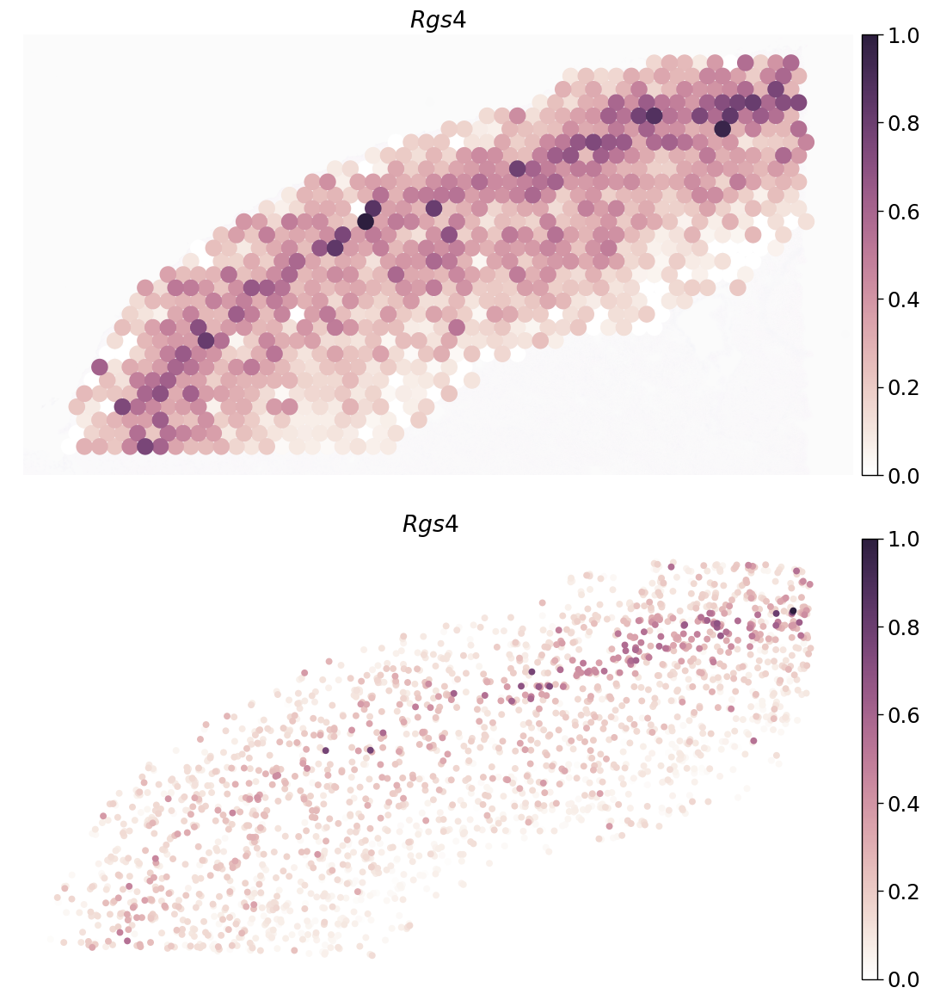

In [405]:
gene = 'Rgs4'   #[L2/3: 'Cux2','Otof', 'Lamp5', 'Nov' | L4: 'Rgs4', 'Rorb', 'Otof' | L5 IT: Ptn, Sulf2, Fezf2 | L6: Pcp4, Osr1 | Oligo: Sox10, Aqp4 | VLMC: Ogn, Lum, and Dcn]

sns.set_context('paper',font_scale=2)
fig, ax = plt.subplots(2,1,figsize=(12, 12),dpi=100)
plt.rcParams["legend.markerscale"] = 2
PlotVisiumGene(slice2,gene,size=1.7,alpha_img=0.05,perc=0,ax=ax[0], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
PlotVisiumGene(ad_scst_slice2,gene,size=2.0,alpha_img=0.05,perc=0,ax=ax[1], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
plt.tight_layout()

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


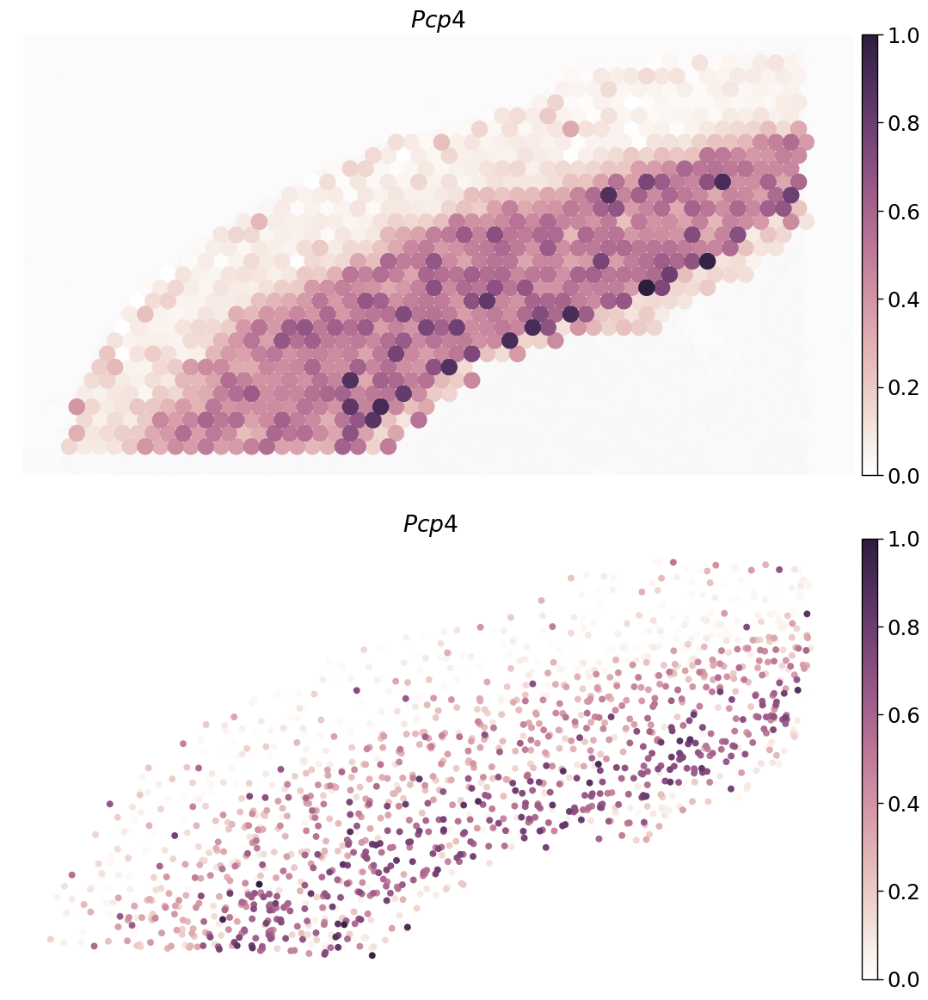

In [407]:
gene = 'Pcp4'   #[L2/3: 'Cux2','Otof', 'Lamp5', 'Nov' | L4: 'Rgs4', 'Rorb', 'Otof' | L5 IT: Ptn, Sulf2, Fezf2 | L6: Pcp4, Osr1 | Oligo: Sox10, Aqp4 | VLMC: Ogn, Lum, and Dcn]

sns.set_context('paper',font_scale=2)
fig, ax = plt.subplots(2,1,figsize=(12, 12),dpi=100)
plt.rcParams["legend.markerscale"] = 2
PlotVisiumGene(slice2,gene,size=1.7,alpha_img=0.05,perc=0,ax=ax[0], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
PlotVisiumGene(ad_scst_slice2,gene,size=2.0,alpha_img=0.05,perc=0,ax=ax[1], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
plt.tight_layout()

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


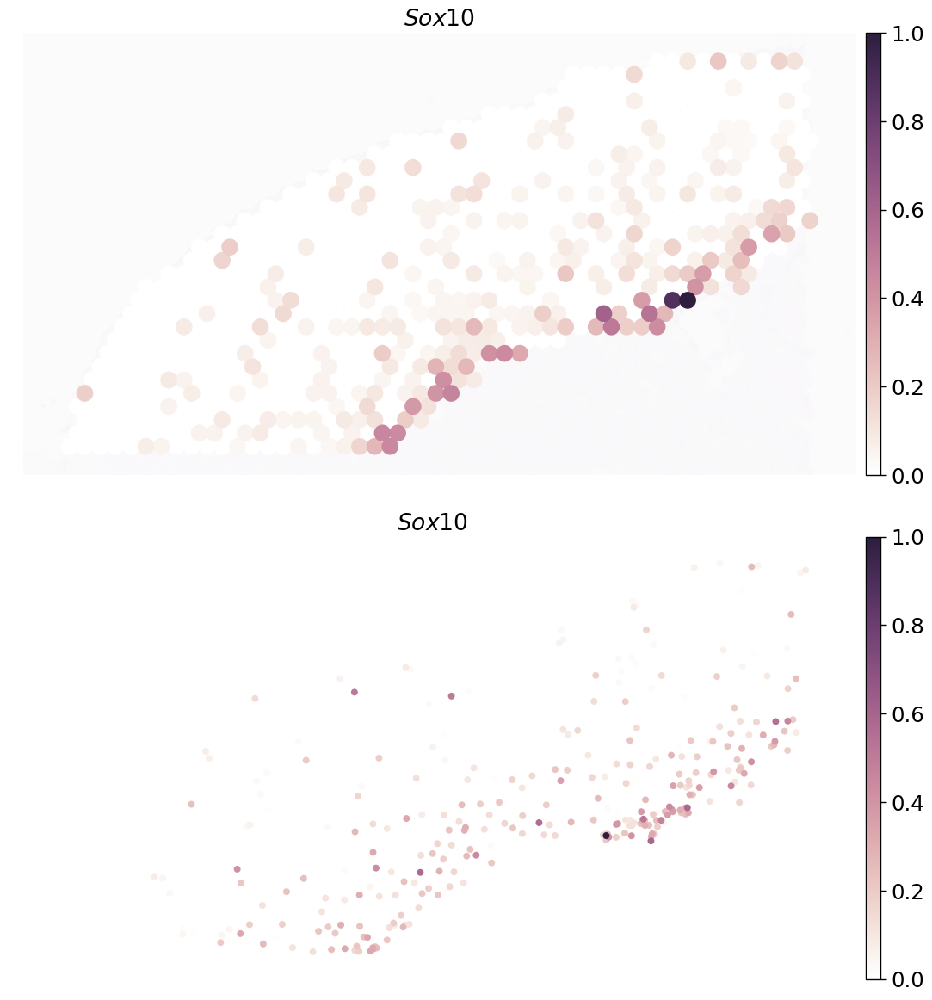

In [408]:
gene = 'Sox10'   #[L2/3: 'Cux2','Otof', 'Lamp5', 'Nov' | L4: 'Rgs4', 'Rorb', 'Otof' | L5 IT: Ptn, Sulf2, Fezf2 | L6: Pcp4, Osr1 | Oligo: Sox10, Aqp4 | VLMC: Ogn, Lum, and Dcn]

sns.set_context('paper',font_scale=2)
fig, ax = plt.subplots(2,1,figsize=(12, 12),dpi=100)
plt.rcParams["legend.markerscale"] = 2
PlotVisiumGene(slice2,gene,size=1.7,alpha_img=0.05,perc=0,ax=ax[0], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
PlotVisiumGene(ad_scst_slice2,gene,size=2.0,alpha_img=0.05,perc=0,ax=ax[1], palette = sns.cubehelix_palette(light = 1, as_cmap = True))
plt.tight_layout()